<a href="https://colab.research.google.com/github/momna763/DIP/blob/main/Lab07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

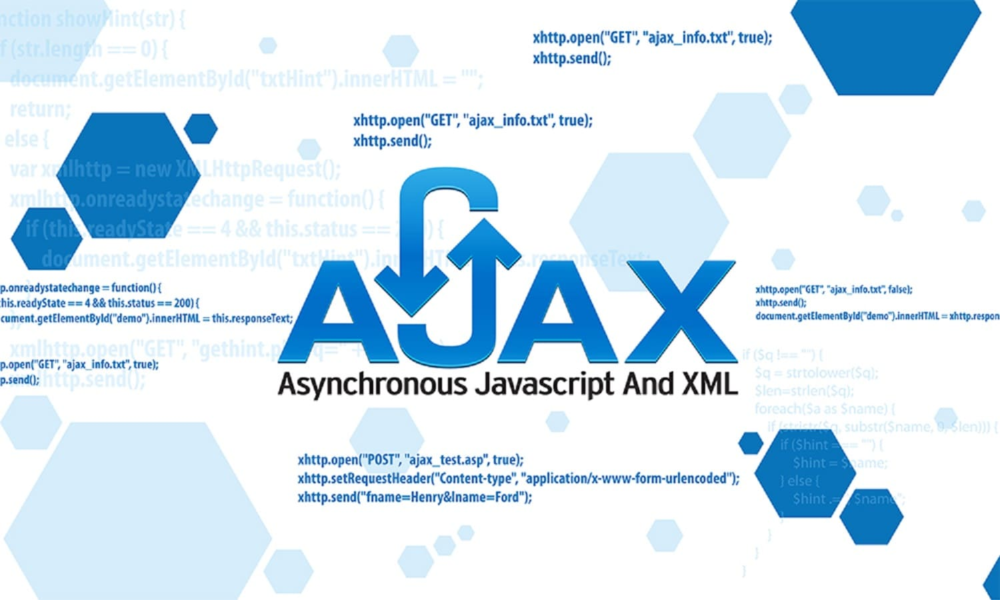

[[[0.98431373 0.92941176 0.84313725]
  [0.98431373 0.92941176 0.84313725]
  [0.98431373 0.92941176 0.84313725]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 [[0.98431373 0.92941176 0.84313725]
  [0.98431373 0.92941176 0.84313725]
  [0.98431373 0.92941176 0.84313725]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 [[0.98431373 0.92941176 0.84313725]
  [0.98431373 0.92941176 0.84313725]
  [0.98431373 0.92941176 0.84313725]
  ...
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]]

 ...

 [[1.         1.         1.        ]
  [1.         1.         1.        ]
  [1.         1.         1.        ]
  ...
  [0.6745098  0.40784314 0.01176471]
  [0.6745098  0.41568627 0.01568627]
  [0.69803922 0.43921569 0.03921569]]

 [[1.         1.         1.        ]
  [1.         1.         1.        ]


In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/image.jpg')
I = img.astype(np.float64) / 255.0

cv2_imshow(img)

print(I)


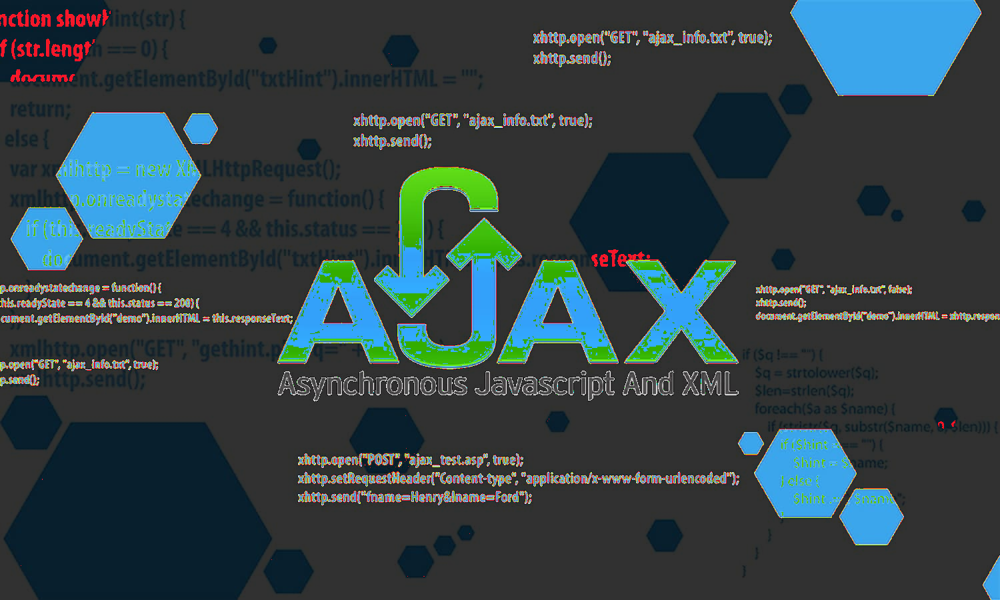

In [ ]:
a = 50

I_bright = np.clip(img + a, 0, 255).astype(np.uint8)

cv2_imshow(I_bright)

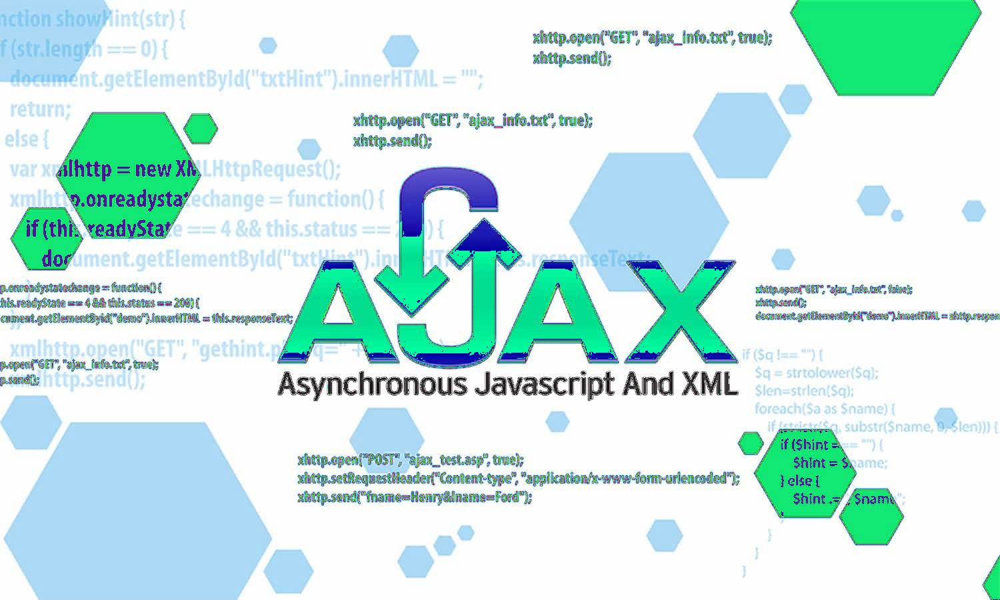

In [ ]:
I_contrast = np.clip(2 * img, 0, 255).astype(np.uint8)

cv2_imshow(I_contrast)

Original Image:


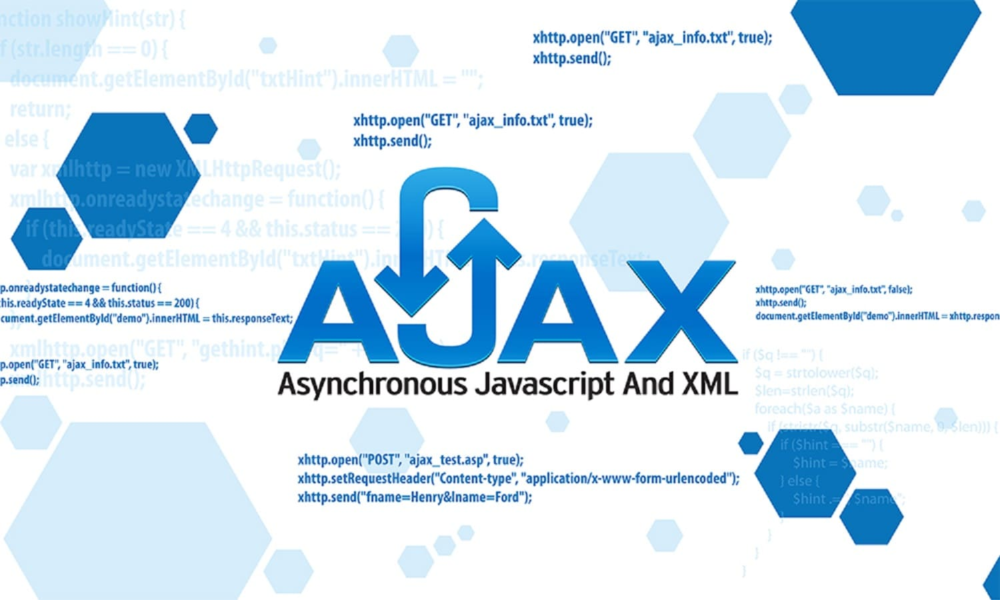

Negative/Inverse Image:


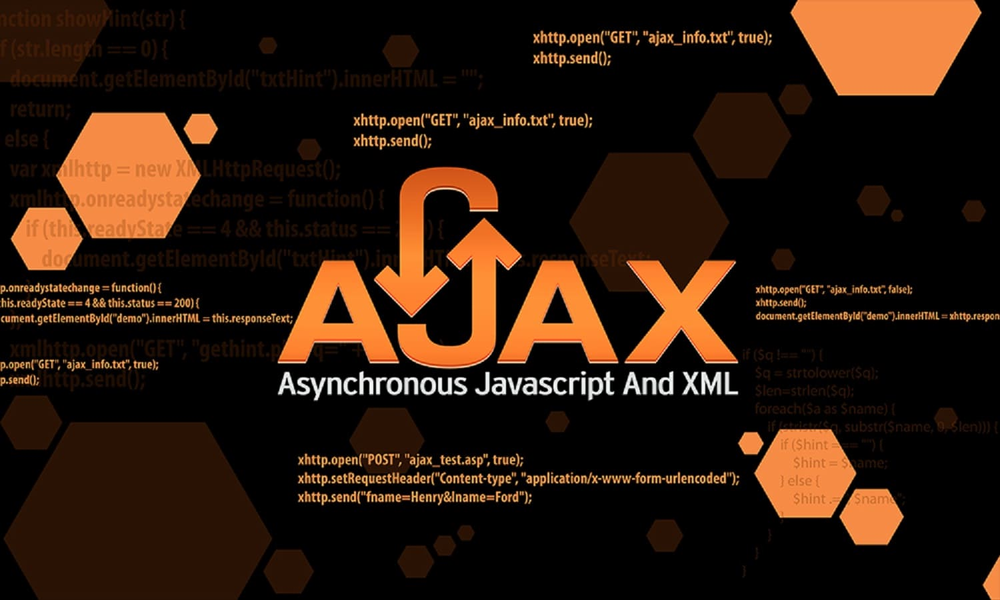

In [ ]:
L = 255

img_neg = L - img

img_neg = np.clip(img_neg, 0, 255).astype(np.uint8)

print("Original Image:")
cv2_imshow(img)

print("Negative/Inverse Image:")
cv2_imshow(img_neg)

Original Image:


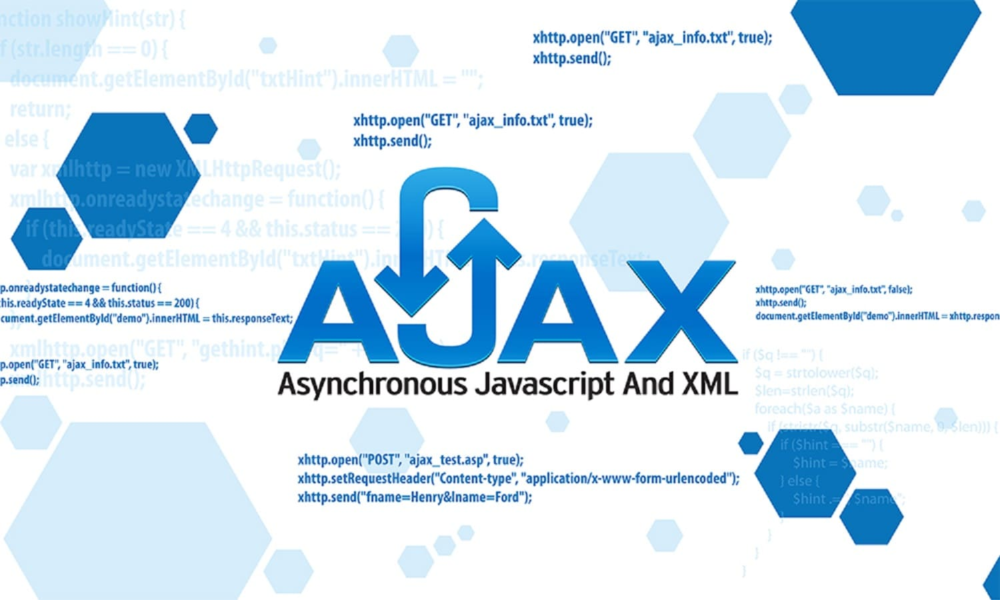

Gamma Corrected Image:


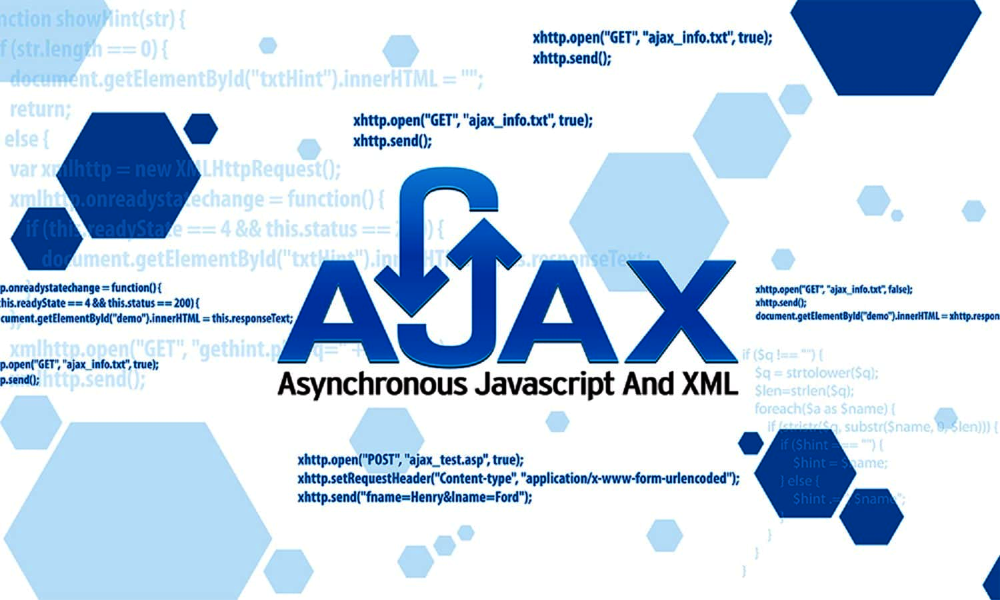

In [ ]:
img_float = img.astype(np.float64) / 255.0

gamma = 2.0

img_gamma_corrected = np.clip(img_float ** gamma, 0, 1)

img_gamma_corrected_8bit = (img_gamma_corrected * 255).astype(np.uint8)

print("Original Image:")
cv2_imshow(img)

print("Gamma Corrected Image:")
cv2_imshow(img_gamma_corrected_8bit)

Original Image:


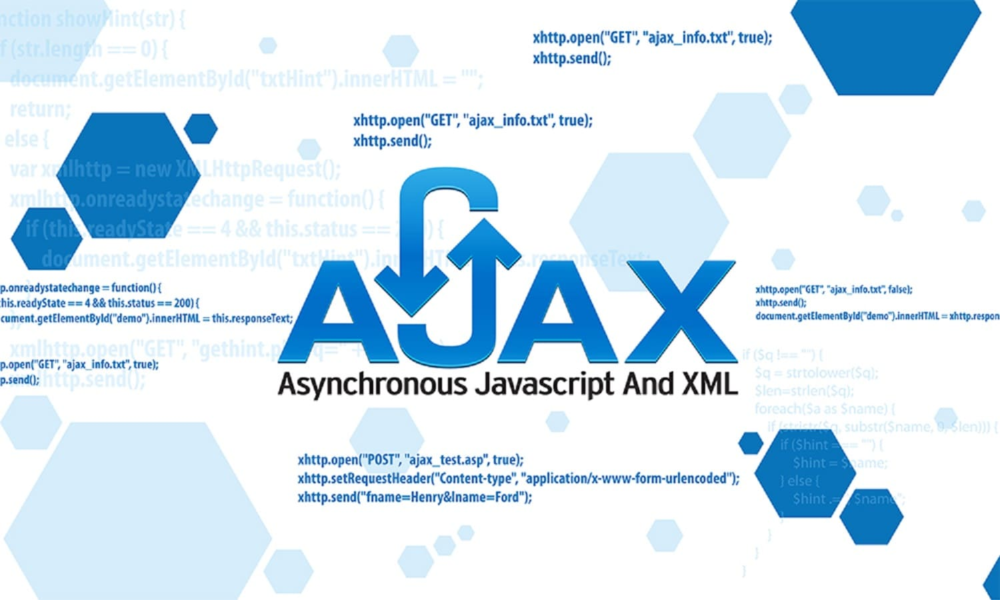

Log Transformed Image:


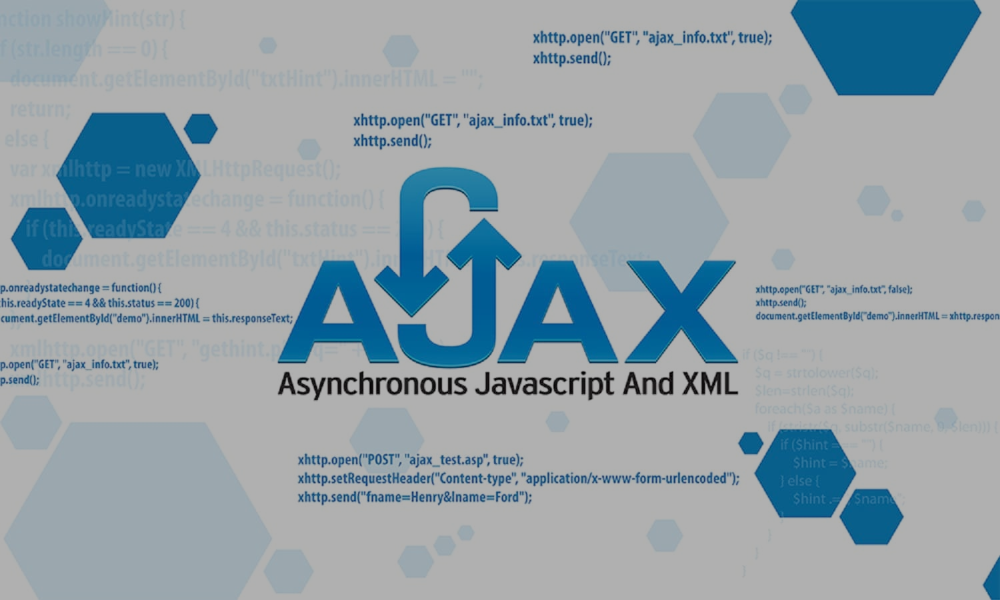

In [7]:
img_float = img.astype(np.float64) / 255.0

c = 255

img_log_transformed = c * np.log(1 + img_float)

img_log_transformed = np.clip(img_log_transformed, 0, c)

img_log_transformed_8bit = (img_log_transformed / c * 255).astype(np.uint8)

print("Original Image:")
cv2_imshow(img)

print("Log Transformed Image:")
cv2_imshow(img_log_transformed_8bit)

Frame 1 shape: (141, 178, 3)
Frame 2 shape: (109, 188, 3)


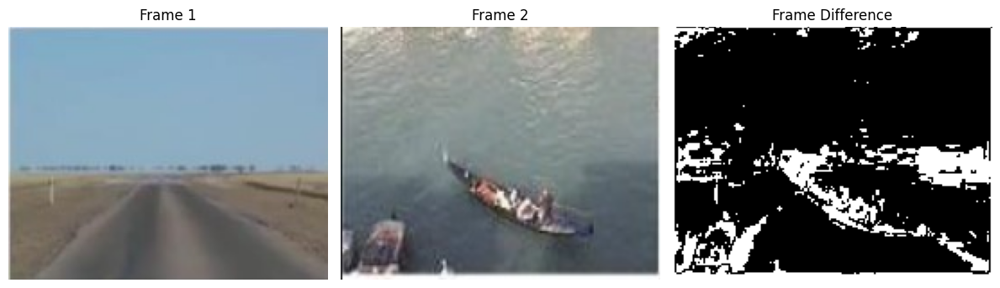

In [9]:
# Load the two frames
frame1 = cv2.imread('/content/frame1.jpeg')  # Replace with your frame path
frame2 = cv2.imread('/content/frame2.jpeg')  # Replace with your frame path

# Check the shape of the frames
print("Frame 1 shape:", frame1.shape)
print("Frame 2 shape:", frame2.shape)

# Resize frame2 to match frame1 (or vice versa)
if frame1.shape != frame2.shape:
    frame2 = cv2.resize(frame2, (frame1.shape[1], frame1.shape[0]))

# Convert the frames to grayscale
frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

# Calculate the absolute difference between the two frames
frame_diff = cv2.absdiff(frame1_gray, frame2_gray)

# Thresholding the difference to get a binary image
_, thresh = cv2.threshold(frame_diff, 30, 255, cv2.THRESH_BINARY)

# Display the original frames and the result
plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB))
plt.title('Frame 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
plt.title('Frame 2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(thresh, cmap='gray')
plt.title('Frame Difference')
plt.axis('off')

plt.tight_layout()
plt.show()


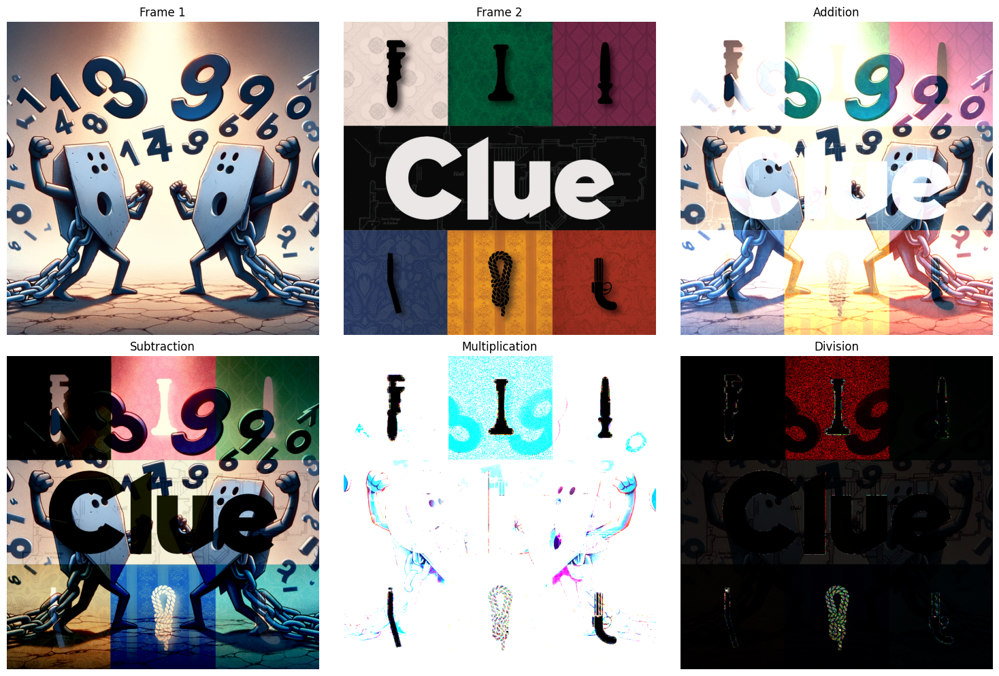

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the two frames
frame1 = cv2.imread('img1.jpg')  # Replace with your frame path
frame2 = cv2.imread('img2.jpg')  # Replace with your frame path

# Resize frame2 to match frame1 if necessary
if frame1.shape != frame2.shape:
    frame2 = cv2.resize(frame2, (frame1.shape[1], frame1.shape[0]))

# Convert the frames to float for accurate calculations
frame1_float = frame1.astype(np.float32)
frame2_float = frame2.astype(np.float32)

# Image Addition
img_add = cv2.add(frame1_float, frame2_float)

# Image Subtraction
img_subtract = cv2.subtract(frame1_float, frame2_float)

# Image Multiplication
img_multiply = cv2.multiply(frame1_float, frame2_float)

# Division with epsilon to avoid division by zero
epsilon = 1e-10  # Small value to prevent division by zero
img_divide = np.divide(frame1_float, (frame2_float + epsilon), where=(frame2_float != 0), out=np.zeros_like(frame1_float))

# Convert back to uint8 for display
img_add = np.clip(img_add, 0, 255).astype(np.uint8)
img_subtract = np.clip(img_subtract, 0, 255).astype(np.uint8)
img_multiply = np.clip(img_multiply, 0, 255).astype(np.uint8)
img_divide = np.clip(img_divide, 0, 255).astype(np.uint8)

# Display the original frames and the results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB))
plt.title('Frame 1')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB))
plt.title('Frame 2')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(img_add, cv2.COLOR_BGR2RGB))
plt.title('Addition')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(img_subtract, cv2.COLOR_BGR2RGB))
plt.title('Subtraction')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(img_multiply, cv2.COLOR_BGR2RGB))
plt.title('Multiplication')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(cv2.cvtColor(img_divide, cv2.COLOR_BGR2RGB))
plt.title('Division')
plt.axis('off')

plt.tight_layout()
plt.show()


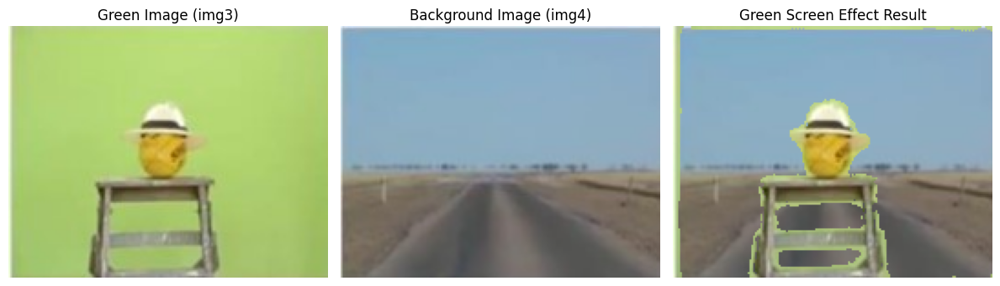

In [13]:
img3 = cv2.imread('img3.jpeg')
img4 = cv2.imread('img4.jpeg')

# Resize img4 to match img3 dimensions
img4 = cv2.resize(img4, (img3.shape[1], img3.shape[0]))

# Convert the green image (img3) to HSV color space
hsv = cv2.cvtColor(img3, cv2.COLOR_BGR2HSV)

# Define the range for green color in HSV
lower_green = np.array([35, 100, 100])  # Lower range for green
upper_green = np.array([85, 255, 255])  # Upper range for green

# Create a mask for green color
mask = cv2.inRange(hsv, lower_green, upper_green)

# Invert the mask to get the foreground (non-green areas)
mask_inv = cv2.bitwise_not(mask)

# Black-out the area of green in img3
img3_fg = cv2.bitwise_and(img3, img3, mask=mask_inv)

# Black-out the area of non-green in img4
img4_bg = cv2.bitwise_and(img4, img4, mask=mask)

# Combine the foreground and background
result = cv2.add(img3_fg, img4_bg)

# Display the original images and the result
plt.figure(figsize=(12, 8))

plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(img3, cv2.COLOR_BGR2RGB))
plt.title('Green Image (img3)')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(img4, cv2.COLOR_BGR2RGB))
plt.title('Background Image (img4)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Green Screen Effect Result')
plt.axis('off')

plt.tight_layout()
plt.show()
